In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/envs/deep/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/Snail/mmCompensated/"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/Snail/mmCompensated/snail4_ice.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail1_phago.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail5_no_bact.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail3_phago.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail1_edta.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail1_no_bact.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail2_edta.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail5_ice.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail3_no_bact.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail5_edta.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail5_phago.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail4_no_bact.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail2_ice.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail3_ice.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail3_edta.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/snail4_edta.mm', '/media/cjw/Data/cyto/Snail/mmCompensated/sn

dict_keys(['snail4_ice.mm', 'snail1_phago.mm', 'snail5_no_bact.mm', 'snail3_phago.mm', 'snail1_edta.mm', 'snail1_no_bact.mm', 'snail2_edta.mm', 'snail5_ice.mm', 'snail3_no_bact.mm', 'snail5_edta.mm', 'snail5_phago.mm', 'snail4_no_bact.mm', 'snail2_ice.mm', 'snail3_ice.mm', 'snail3_edta.mm', 'snail4_edta.mm', 'snail2_phago.mm', 'snail4_phago.mm', 'snail1_ice.mm', 'snail2_no_bact.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

9367
9746
9962
8169
9600
9852
9680
9691
8929
9727
9944
9786
9230
8742
9068
9886
9549
9967
9511
9621


Encoder True
Tensor("Placeholder:0", shape=(?, 32, 32, 4), dtype=float32) (?, 32, 32, 4)
isize:  4 32
dh0 (?, 32, 32, 4)
190027 1484 128
Epoch:  0 Iteration:  0 Loss:  623.5413 618.5243 5.017002


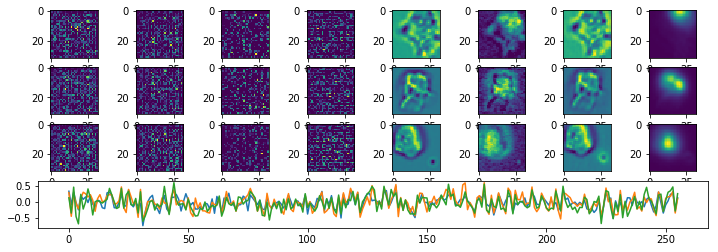

Epoch:  0 Iteration:  1000 Loss:  11.375672 10.92168 0.45399225


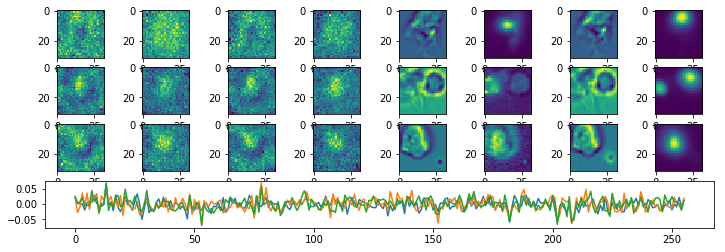

Epoch:  1 Iteration:  0 Loss:  8.917944 8.605318 0.31262562


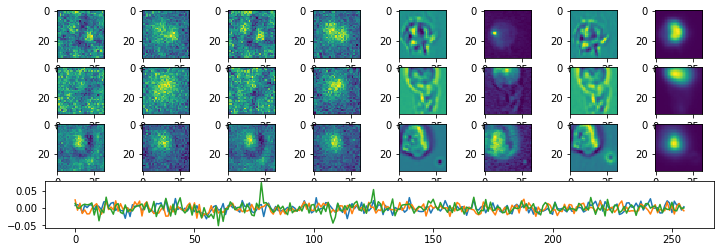

Epoch:  1 Iteration:  1000 Loss:  6.57968 6.28996 0.28972006


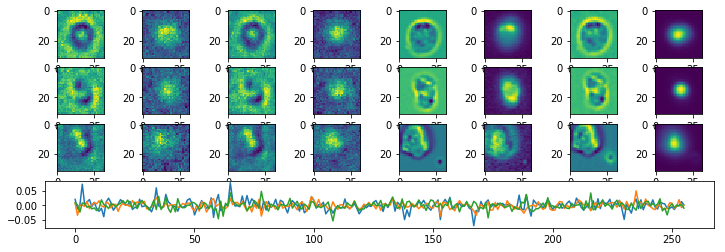

Epoch:  2 Iteration:  0 Loss:  5.6462827 5.380535 0.26574752


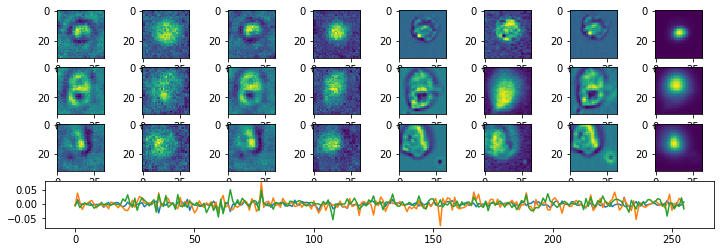

Epoch:  2 Iteration:  1000 Loss:  4.7288866 4.4722643 0.25662234


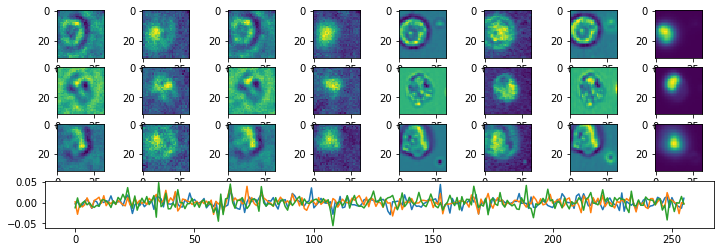

Epoch:  3 Iteration:  0 Loss:  4.287451 4.04653 0.24092089


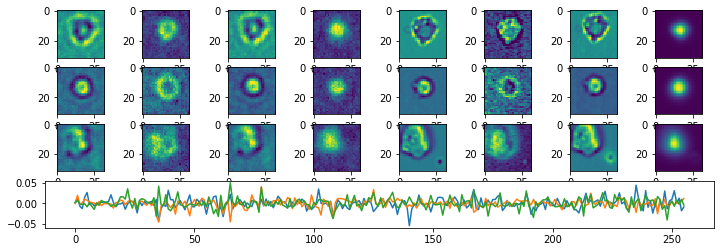

Epoch:  3 Iteration:  1000 Loss:  3.6689396 3.4388108 0.23012872


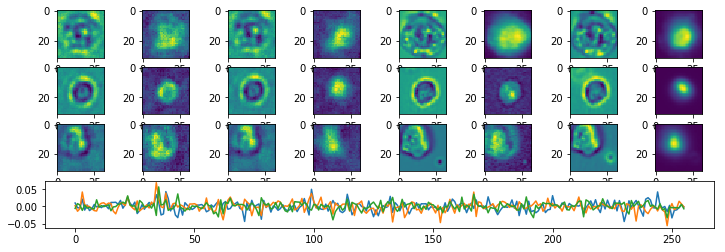

Epoch:  4 Iteration:  0 Loss:  3.4374678 3.2230222 0.21444567


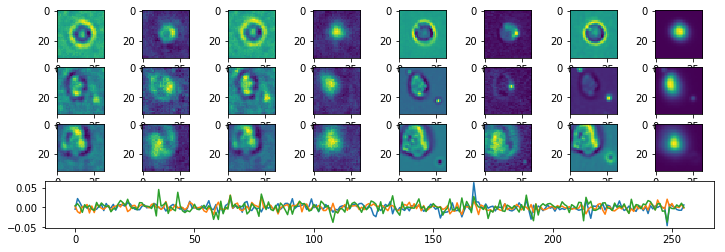

Epoch:  4 Iteration:  1000 Loss:  3.032136 2.820556 0.21157993


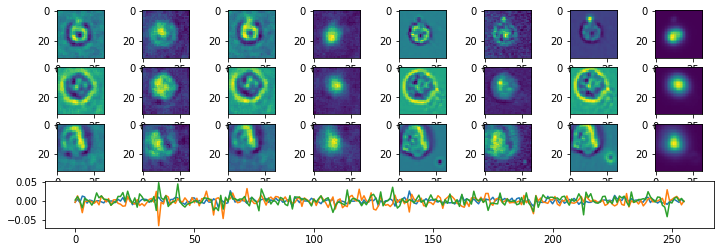

Epoch:  5 Iteration:  0 Loss:  2.887946 2.692328 0.19561799


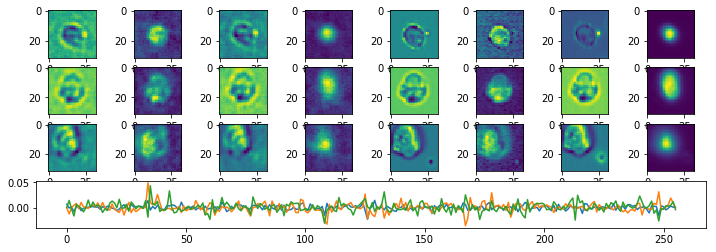

Epoch:  5 Iteration:  1000 Loss:  2.9067516 2.6213663 0.28538534


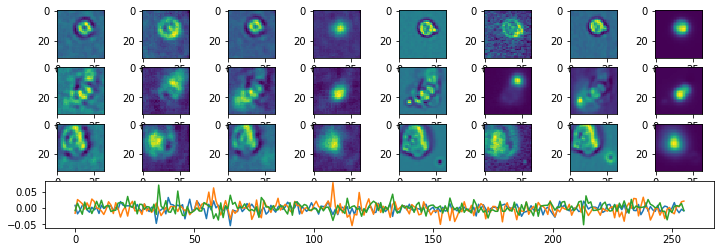

Epoch:  6 Iteration:  0 Loss:  2.8223655 2.5877361 0.23462929


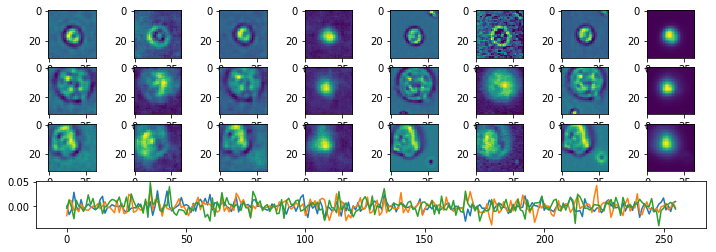

Epoch:  6 Iteration:  1000 Loss:  2.6404815 2.4309695 0.2095121


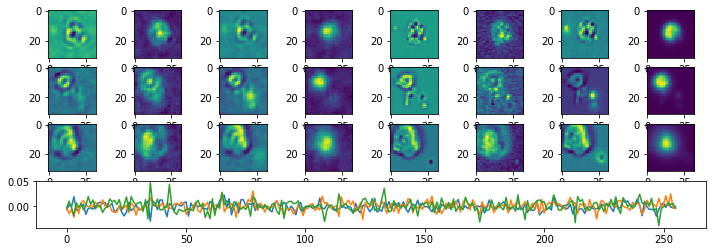

Epoch:  7 Iteration:  0 Loss:  2.5978239 2.4057677 0.19205621


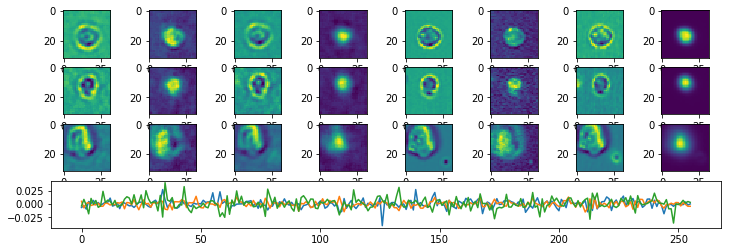

Epoch:  7 Iteration:  1000 Loss:  2.4401958 2.2591445 0.1810513


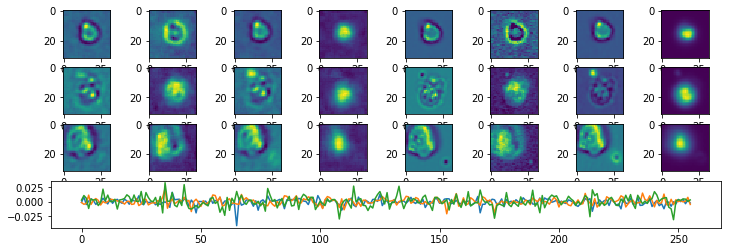

Epoch:  8 Iteration:  0 Loss:  2.4258566 2.2602487 0.165608


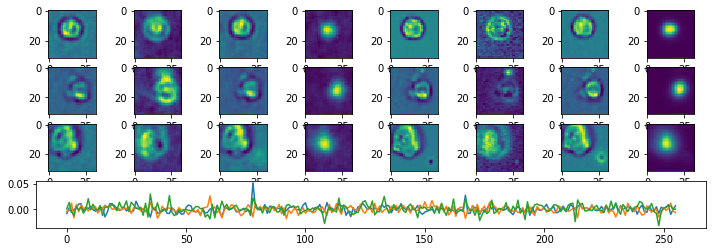

Epoch:  8 Iteration:  1000 Loss:  2.251108 2.088293 0.16281492


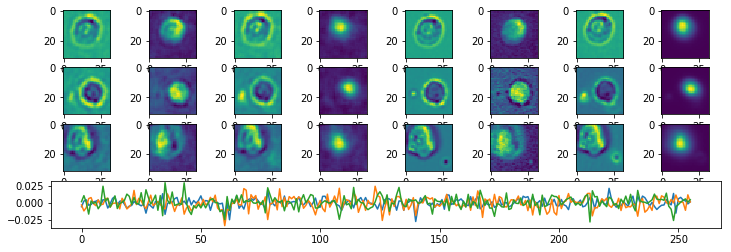

Epoch:  9 Iteration:  0 Loss:  2.25606 2.1035905 0.15246949


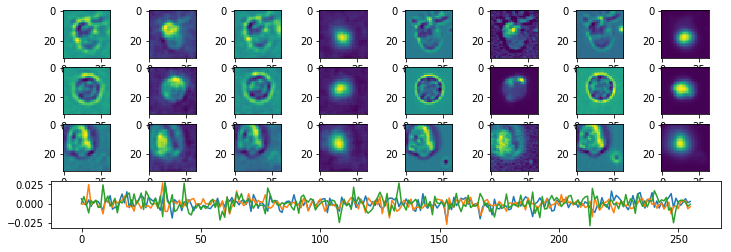

Epoch:  9 Iteration:  1000 Loss:  2.103403 1.9512821 0.15212095


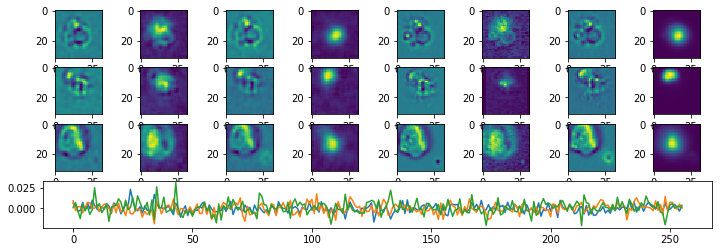

Epoch:  10 Iteration:  0 Loss:  2.130461 2.0022893 0.12817161


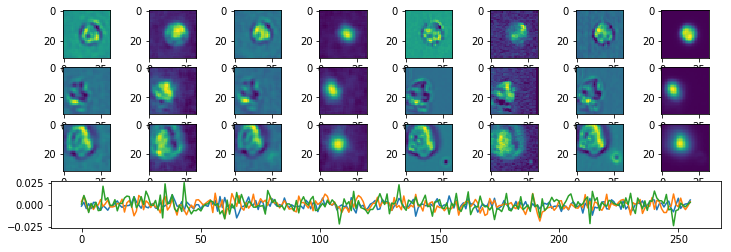

Epoch:  10 Iteration:  1000 Loss:  2.2287922 2.0109205 0.21787159


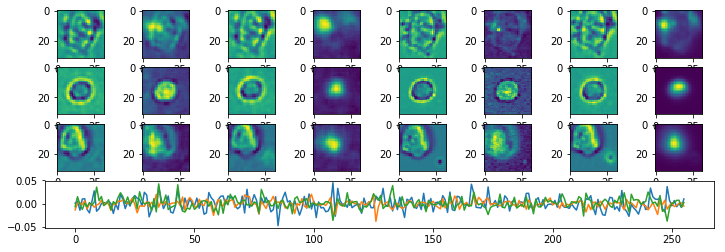

Epoch:  11 Iteration:  0 Loss:  2.1534715 1.9625876 0.19088379


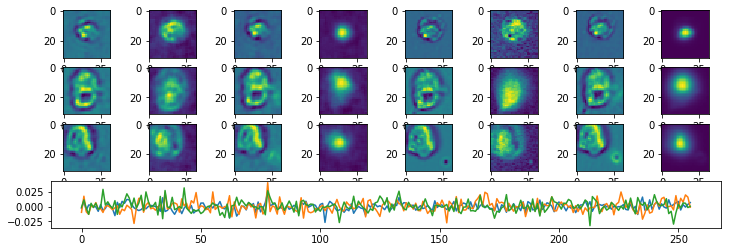

Epoch:  11 Iteration:  1000 Loss:  2.0510945 1.8804493 0.17064518


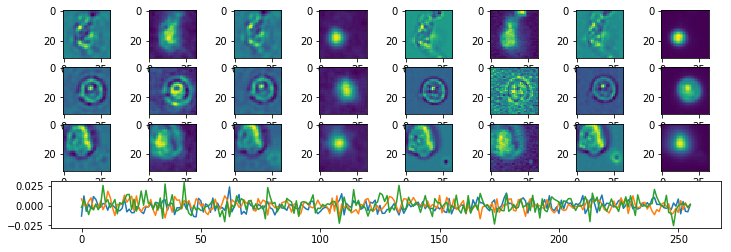

Epoch:  12 Iteration:  0 Loss:  2.0224354 1.8621798 0.16025577


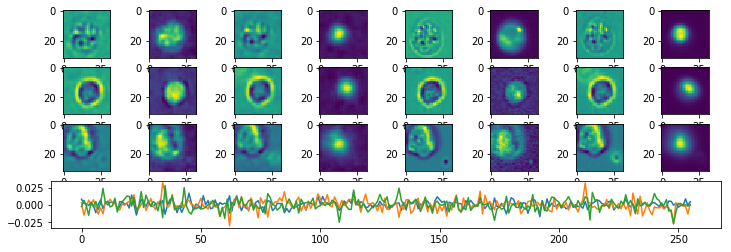

Epoch:  12 Iteration:  1000 Loss:  1.9538472 1.8005939 0.15325333


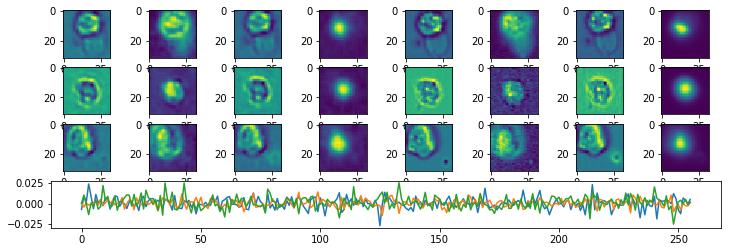

Epoch:  13 Iteration:  0 Loss:  1.9597329 1.812253 0.14747992


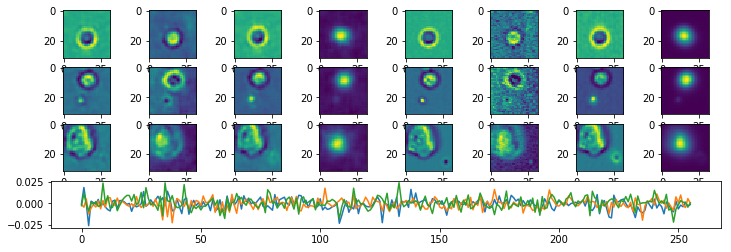

Epoch:  13 Iteration:  1000 Loss:  1.8841051 1.747197 0.13690804


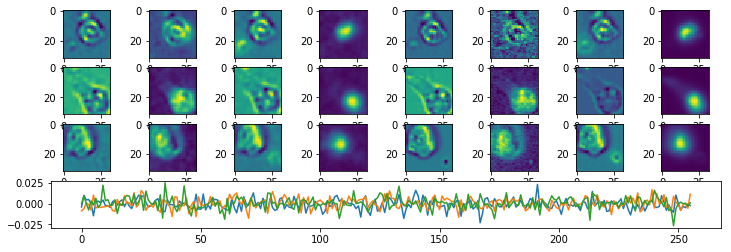

Epoch:  14 Iteration:  0 Loss:  1.8859924 1.7538003 0.13219215


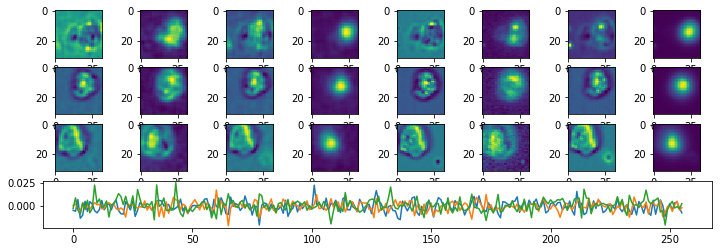

Epoch:  14 Iteration:  1000 Loss:  2.3523414 2.041206 0.31113544


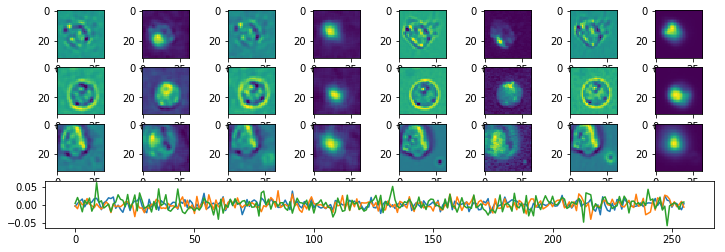

Epoch:  15 Iteration:  0 Loss:  2.0705373 1.8488356 0.2217018


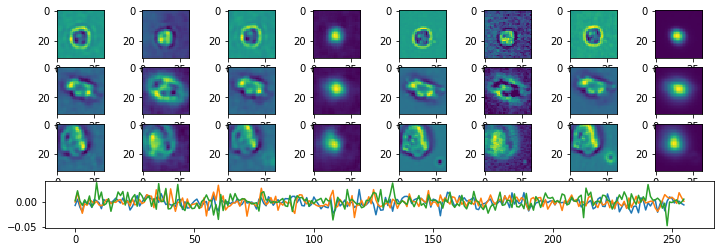

Epoch:  15 Iteration:  1000 Loss:  1.8765001 1.7036085 0.17289162


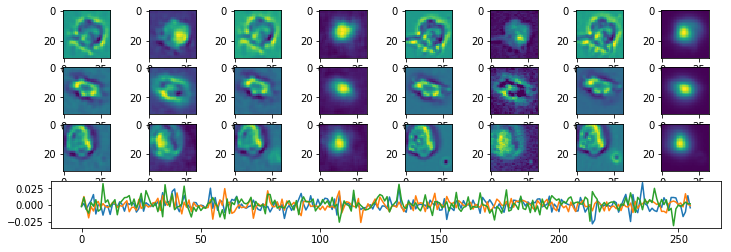

Epoch:  16 Iteration:  0 Loss:  1.8700817 1.7112957 0.15878595


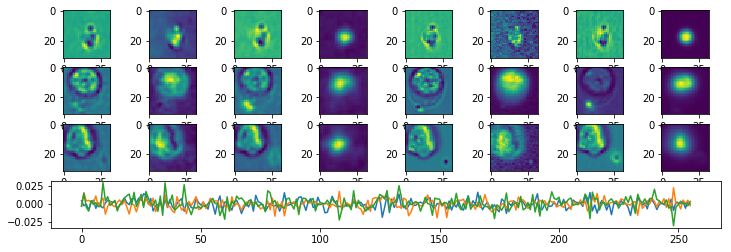

Epoch:  16 Iteration:  1000 Loss:  1.7957566 1.6527318 0.14302482


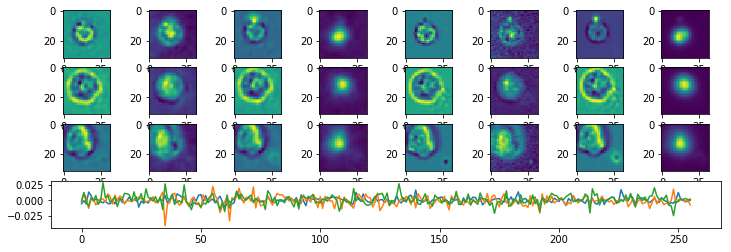

Epoch:  17 Iteration:  0 Loss:  1.8173157 1.6834129 0.13390274


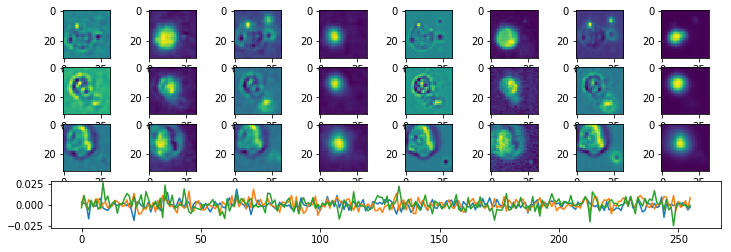

Epoch:  17 Iteration:  1000 Loss:  1.7313606 1.6059515 0.12540902


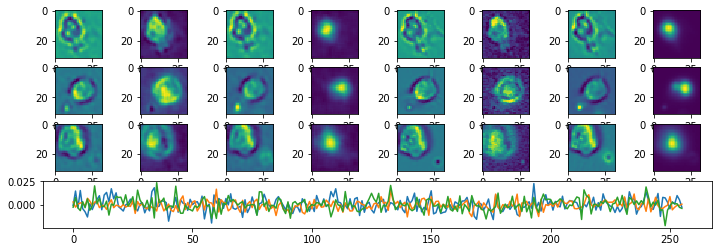

Epoch:  18 Iteration:  0 Loss:  1.7594458 1.6271211 0.13232468


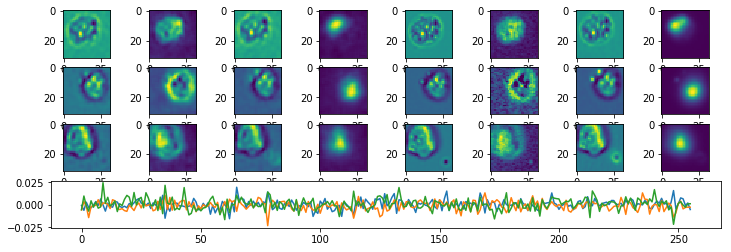

Epoch:  18 Iteration:  1000 Loss:  1.6677701 1.541892 0.12587813


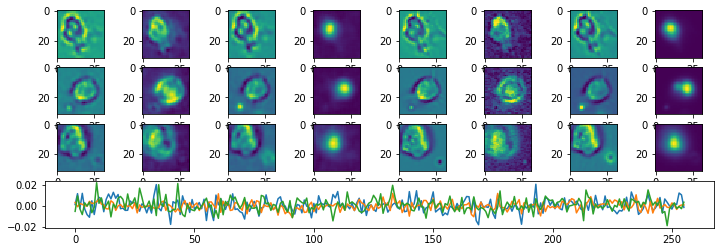

Epoch:  19 Iteration:  0 Loss:  2.1946173 1.9425304 0.252087


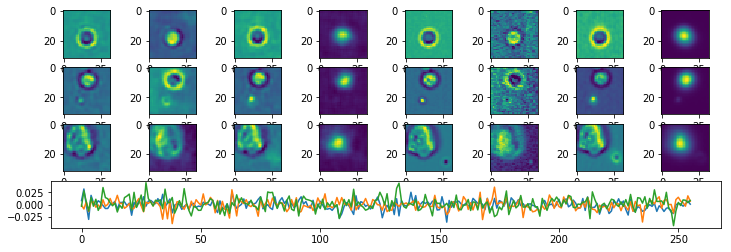

Epoch:  19 Iteration:  1000 Loss:  1.805794 1.623675 0.18211903


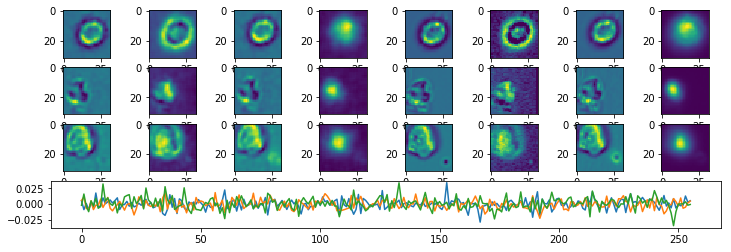

Epoch:  20 Iteration:  0 Loss:  1.7781451 1.6121426 0.16600245


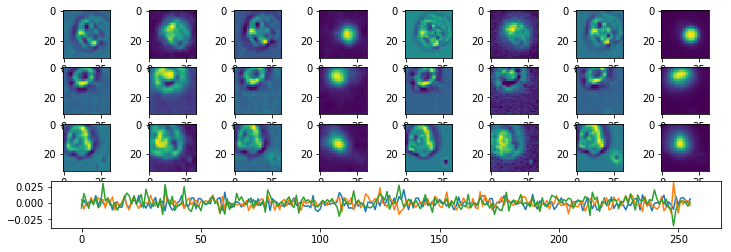

Epoch:  20 Iteration:  1000 Loss:  1.6916265 1.5470307 0.14459589


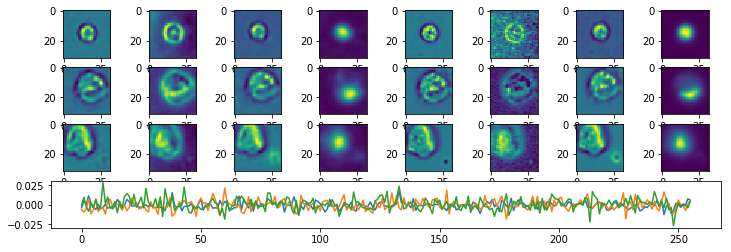

Epoch:  21 Iteration:  0 Loss:  1.6936383 1.5562582 0.13738006


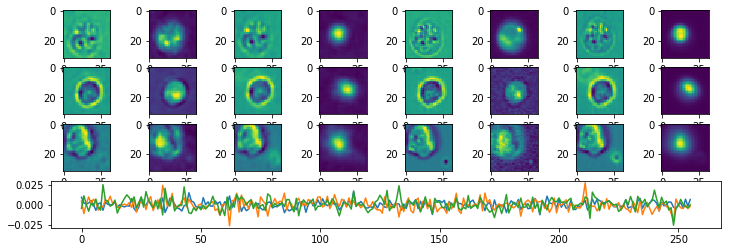

Epoch:  21 Iteration:  1000 Loss:  1.6600722 1.5242877 0.13578455


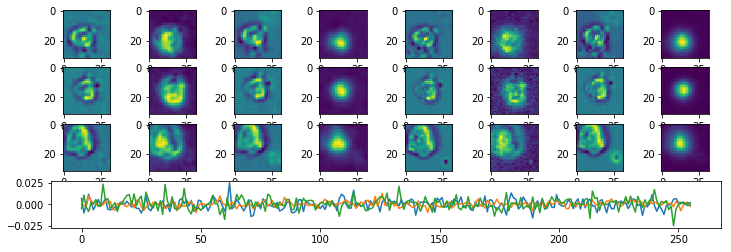

Epoch:  22 Iteration:  0 Loss:  1.6598954 1.53477 0.12512545


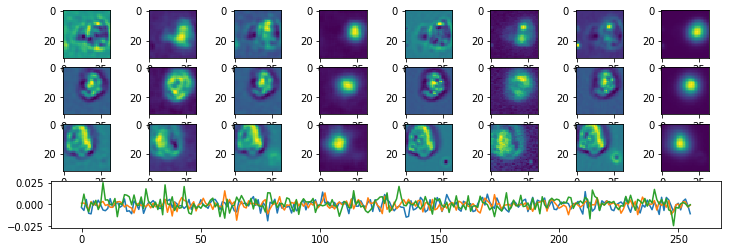

Epoch:  22 Iteration:  1000 Loss:  1.6080773 1.4874516 0.12062571


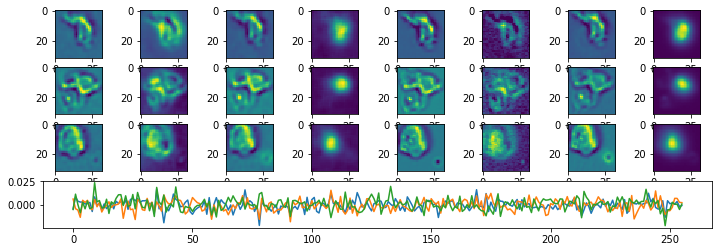

Epoch:  23 Iteration:  0 Loss:  1.6139507 1.4983659 0.11558484


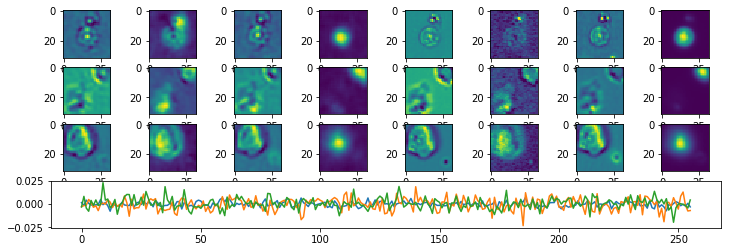

Epoch:  23 Iteration:  1000 Loss:  2.496429 2.1754909 0.3209382


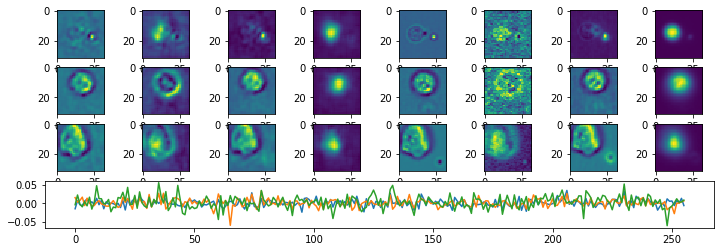

Epoch:  24 Iteration:  0 Loss:  1.9196326 1.7056901 0.2139424


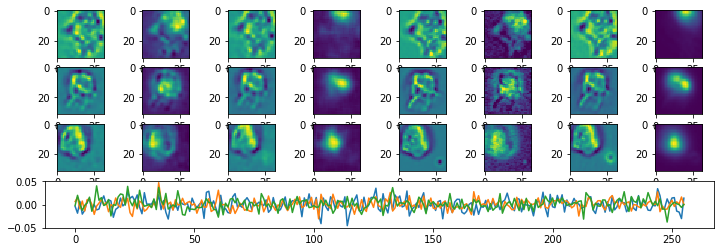

Epoch:  24 Iteration:  1000 Loss:  1.7073641 1.5375732 0.16979086


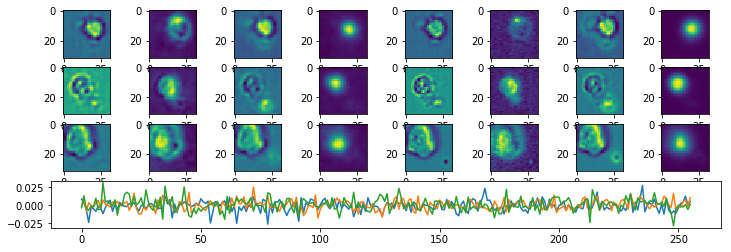

Epoch:  25 Iteration:  0 Loss:  1.6851852 1.5301908 0.15499443


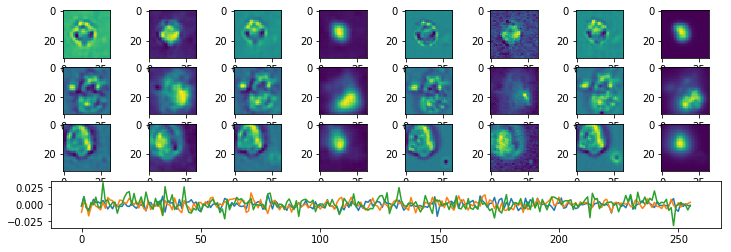

Epoch:  25 Iteration:  1000 Loss:  1.6021976 1.4600394 0.14215833


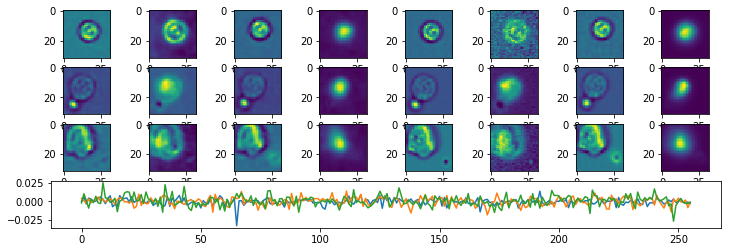

Epoch:  26 Iteration:  0 Loss:  1.6015457 1.4676269 0.13391879


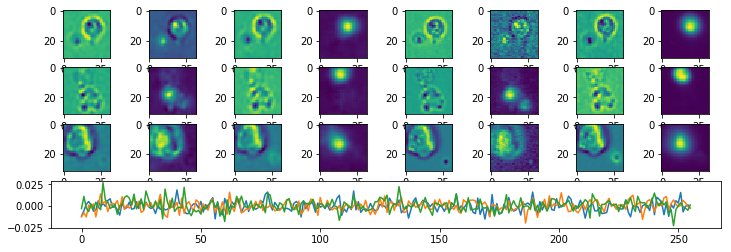

Epoch:  26 Iteration:  1000 Loss:  1.5587659 1.4306592 0.12810671


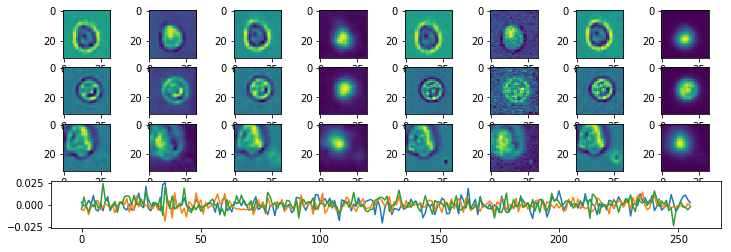

Epoch:  27 Iteration:  0 Loss:  1.5665884 1.4478247 0.11876374


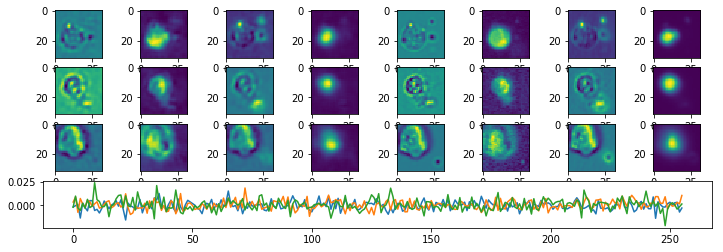

Epoch:  27 Iteration:  1000 Loss:  1.5085082 1.3958216 0.112686574


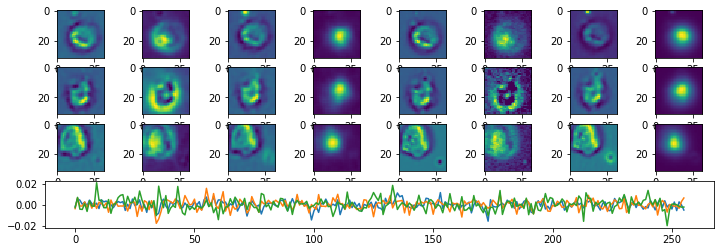

Epoch:  28 Iteration:  0 Loss:  1.5160173 1.4045384 0.11147896


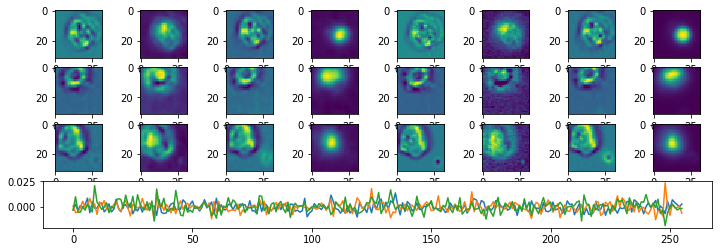

Epoch:  28 Iteration:  1000 Loss:  2.354569 2.0501072 0.30446163


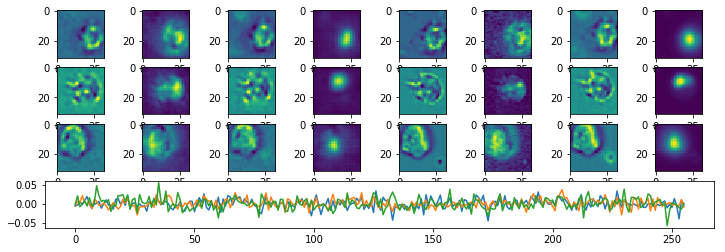

Epoch:  29 Iteration:  0 Loss:  1.7833153 1.579161 0.20415427


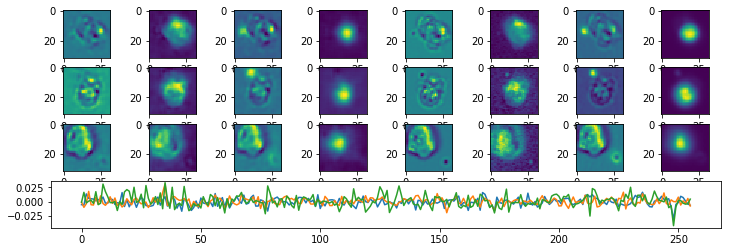

Epoch:  29 Iteration:  1000 Loss:  1.5878003 1.4309891 0.15681112


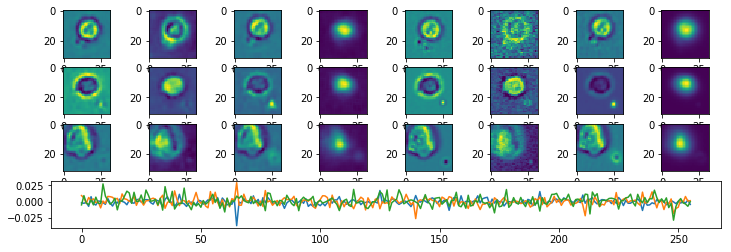

Epoch:  30 Iteration:  0 Loss:  1.5638905 1.4181659 0.14572452


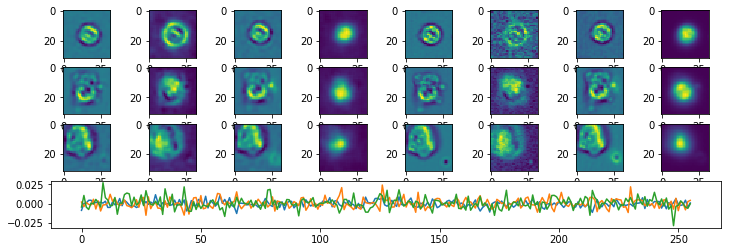

Epoch:  30 Iteration:  1000 Loss:  1.5025452 1.3683674 0.13417777


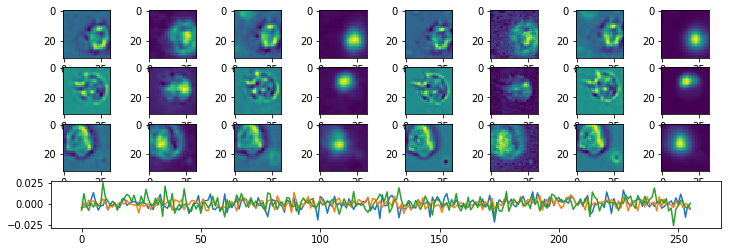

Epoch:  31 Iteration:  0 Loss:  1.4939682 1.3690871 0.124881096


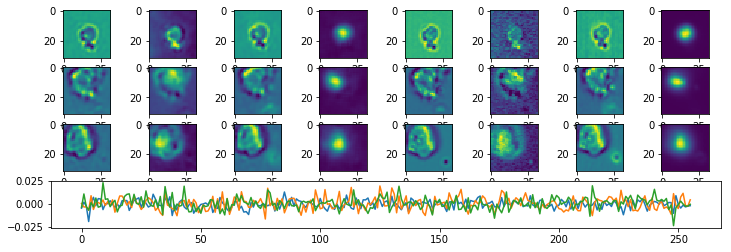

Epoch:  31 Iteration:  1000 Loss:  1.4588958 1.3398561 0.119039685


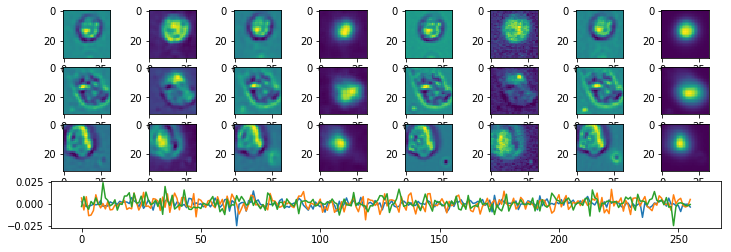

Epoch:  32 Iteration:  0 Loss:  1.4597297 1.3434241 0.11630562


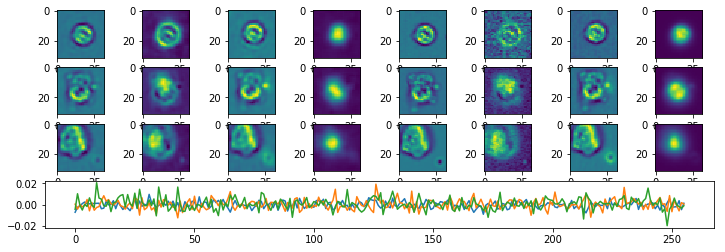

Epoch:  32 Iteration:  1000 Loss:  1.4132171 1.3057044 0.10751272


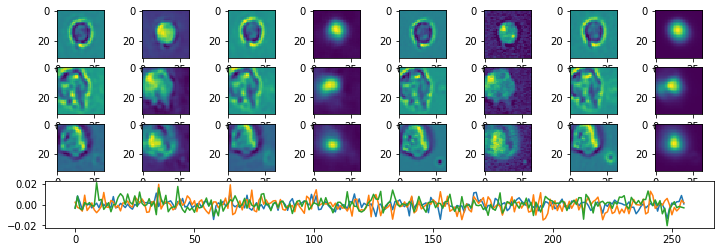

Epoch:  33 Iteration:  0 Loss:  1.4397424 1.3322554 0.10748704


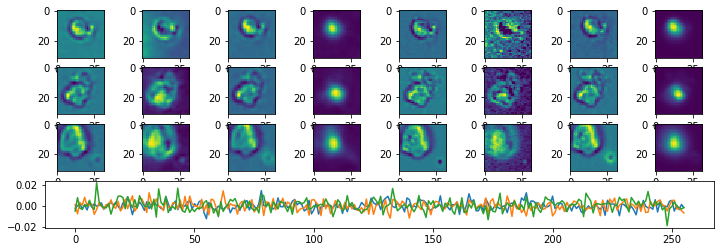

Epoch:  33 Iteration:  1000 Loss:  1.3872049 1.2839304 0.103274435


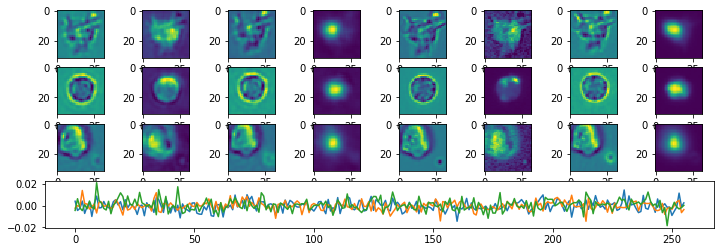

Epoch:  34 Iteration:  0 Loss:  1.9963198 1.7589018 0.23741792


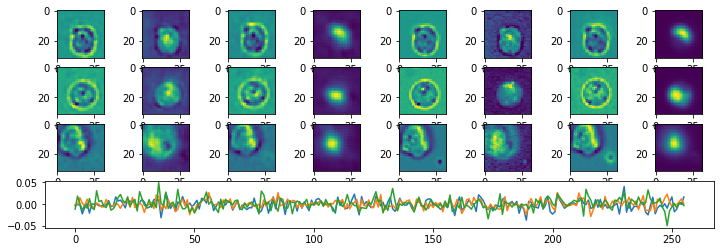

Epoch:  34 Iteration:  1000 Loss:  1.5142188 1.3667219 0.1474969


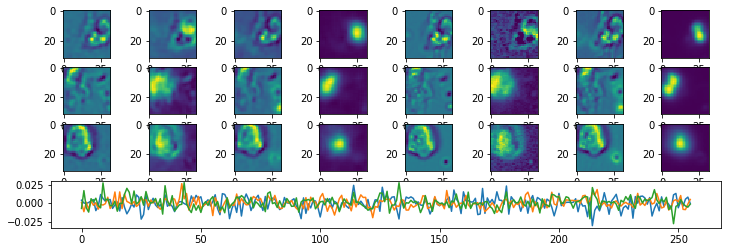

Epoch:  35 Iteration:  0 Loss:  1.4728248 1.3385353 0.13428946


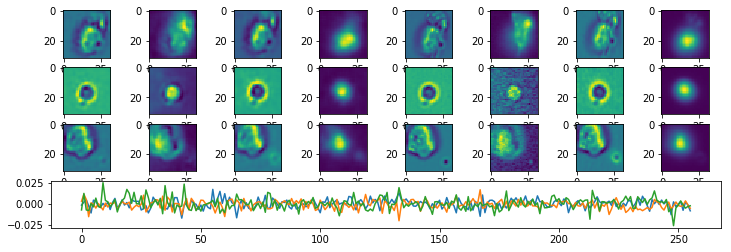

Epoch:  35 Iteration:  1000 Loss:  1.4053317 1.2816186 0.1237131


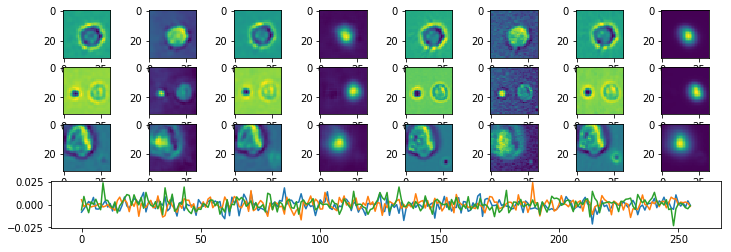

Epoch:  36 Iteration:  0 Loss:  1.4083623 1.29091 0.11745225


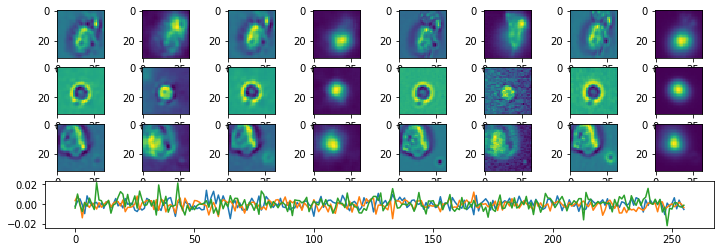

Epoch:  36 Iteration:  1000 Loss:  1.3798037 1.2656914 0.114112206


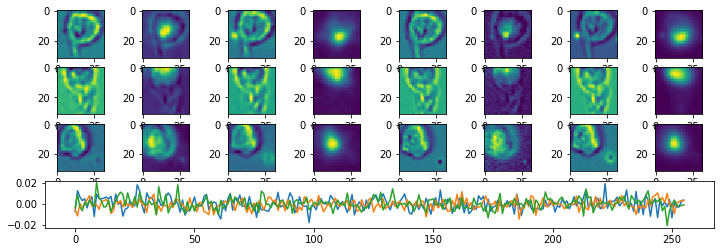

Epoch:  37 Iteration:  0 Loss:  1.3730385 1.2655559 0.10748273


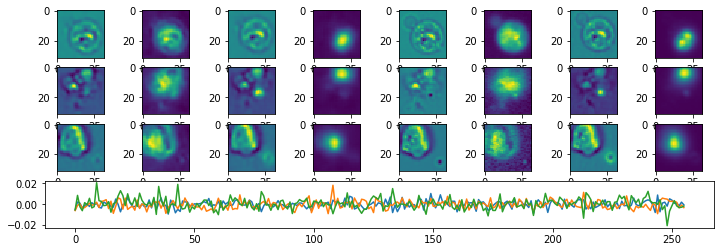

Epoch:  37 Iteration:  1000 Loss:  1.3569778 1.2551386 0.10183913


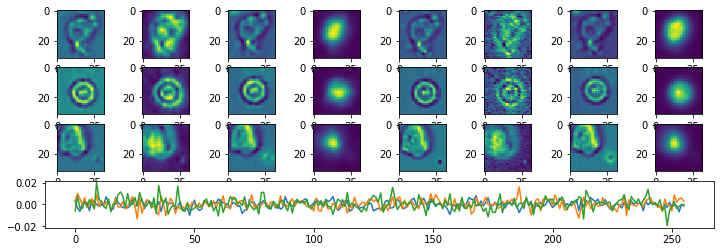

Epoch:  38 Iteration:  0 Loss:  2.3615603 2.1056285 0.2559318


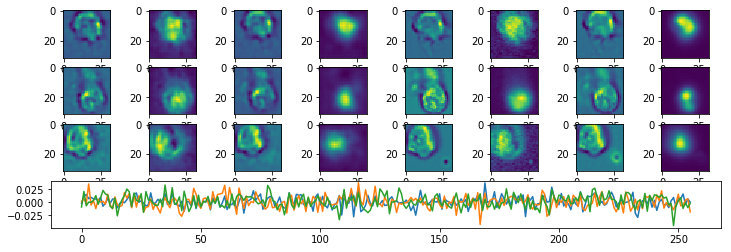

Epoch:  38 Iteration:  1000 Loss:  1.5113918 1.3591831 0.15220873


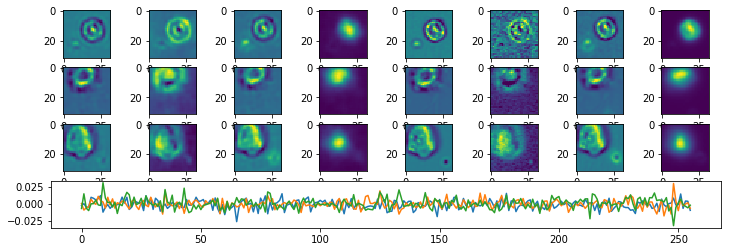

Epoch:  39 Iteration:  0 Loss:  1.469923 1.3305354 0.13938758


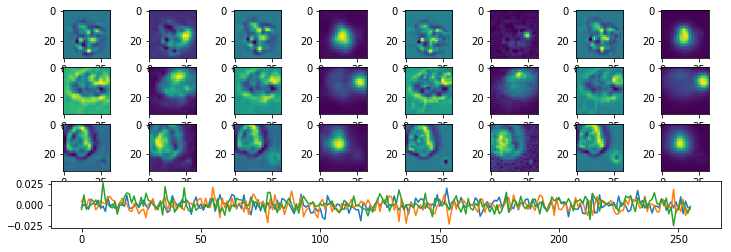

Epoch:  39 Iteration:  1000 Loss:  1.3939602 1.2685897 0.12537047


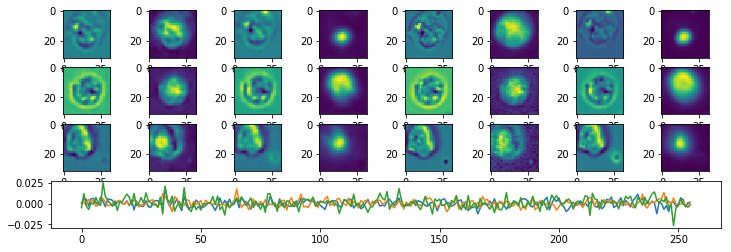

Epoch:  40 Iteration:  0 Loss:  1.3919069 1.2709084 0.120998465


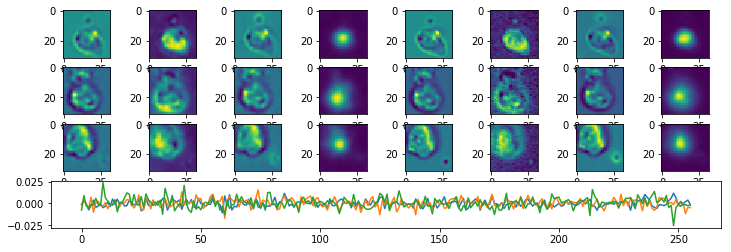

Epoch:  40 Iteration:  1000 Loss:  1.3516238 1.2422171 0.10940676


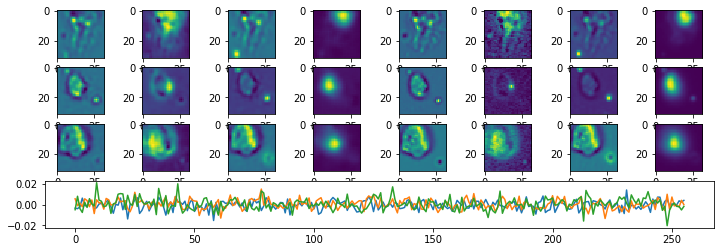

Epoch:  41 Iteration:  0 Loss:  1.3601812 1.253386 0.10679517


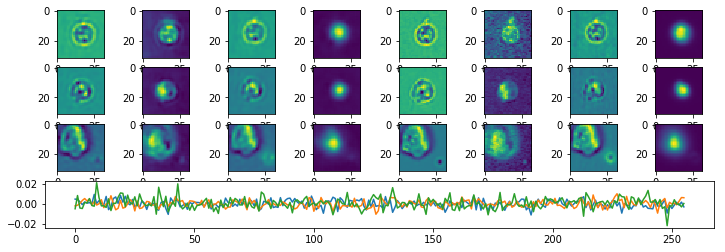

Epoch:  41 Iteration:  1000 Loss:  1.3398468 1.2373403 0.10250656


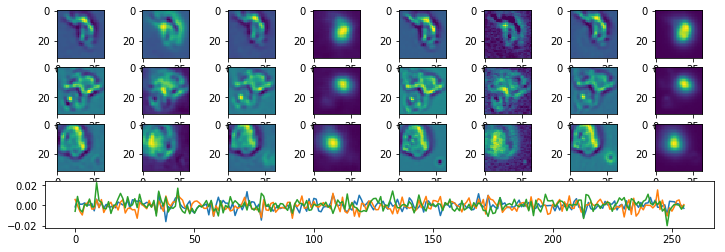

Epoch:  42 Iteration:  0 Loss:  1.3306047 1.2297673 0.10083738


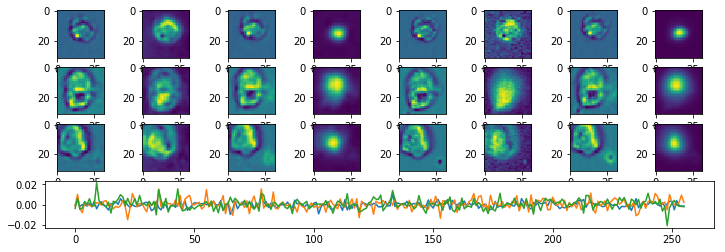

Epoch:  42 Iteration:  1000 Loss:  1.6442648 1.4597174 0.18454741


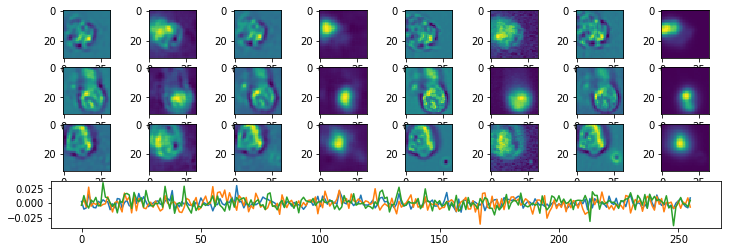

Epoch:  43 Iteration:  0 Loss:  1.4986612 1.3510475 0.14761363


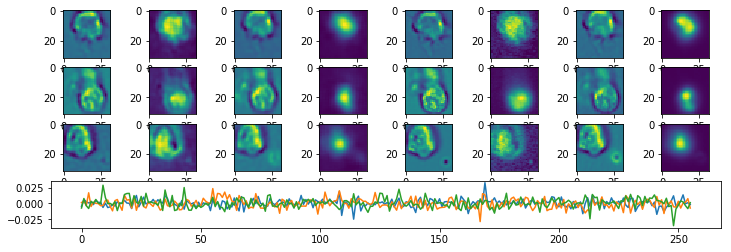

Epoch:  43 Iteration:  1000 Loss:  1.3836375 1.2583535 0.12528409


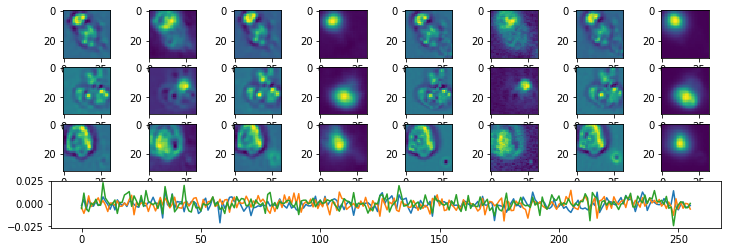

Epoch:  44 Iteration:  0 Loss:  1.3627009 1.2420088 0.12069211


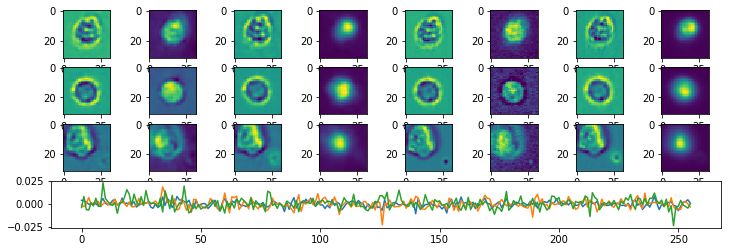

Epoch:  44 Iteration:  1000 Loss:  1.3405751 1.2314811 0.109094046


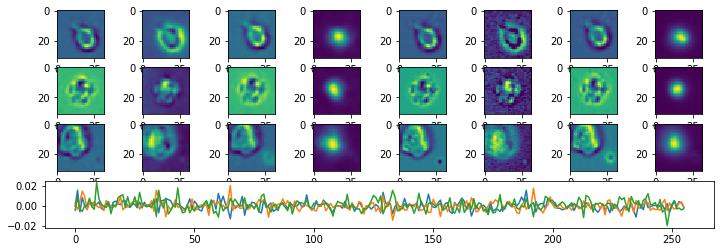

Epoch:  45 Iteration:  0 Loss:  1.3247204 1.220716 0.10400443


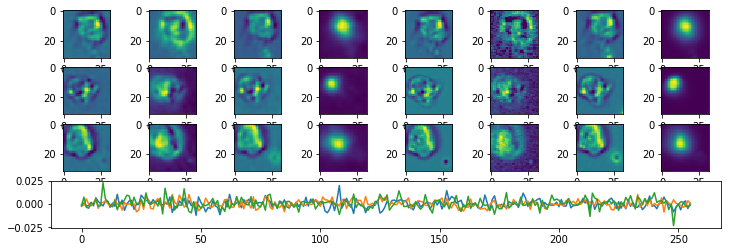

Epoch:  45 Iteration:  1000 Loss:  1.2743586 1.1712877 0.10307093


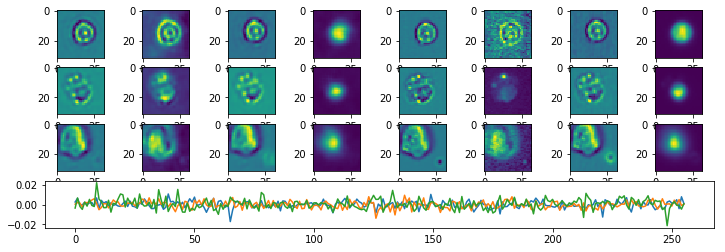

Epoch:  46 Iteration:  0 Loss:  1.3058211 1.2062931 0.09952791


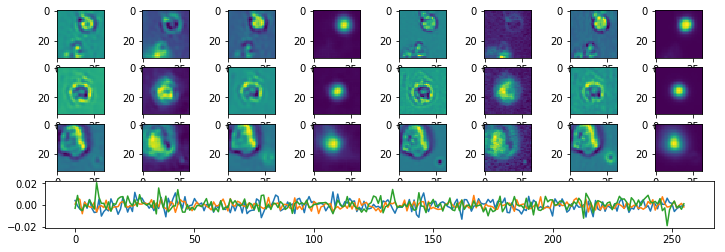

Epoch:  46 Iteration:  1000 Loss:  1.577772 1.3995094 0.17826264


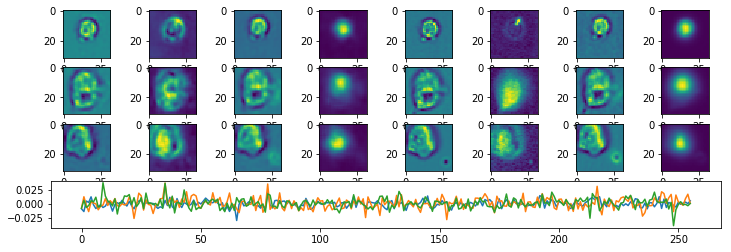

Epoch:  47 Iteration:  0 Loss:  1.4408516 1.2965269 0.14432462


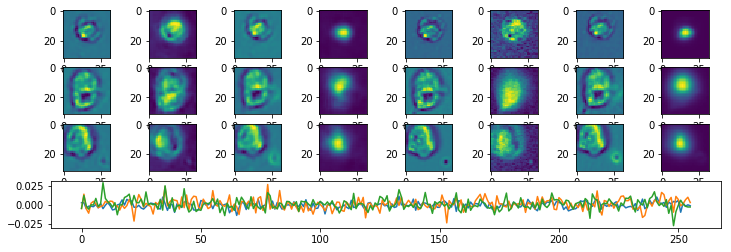

Epoch:  47 Iteration:  1000 Loss:  1.3399526 1.2208005 0.1191521


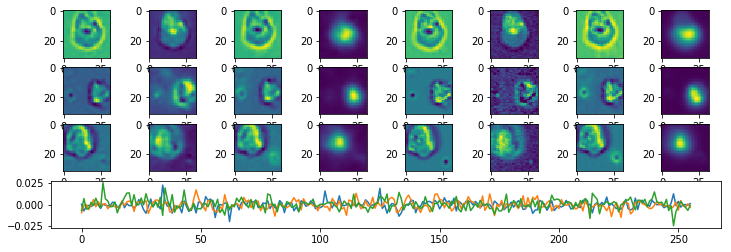

Epoch:  48 Iteration:  0 Loss:  1.3277737 1.2109389 0.11683477


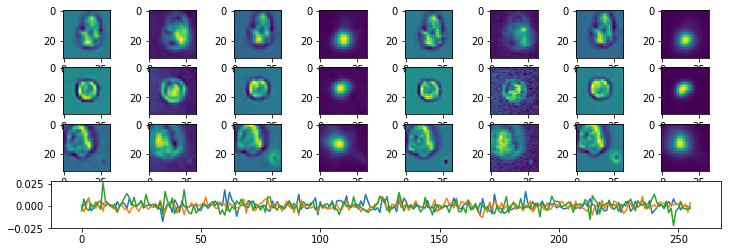

Epoch:  48 Iteration:  1000 Loss:  1.3032802 1.1947304 0.10854978


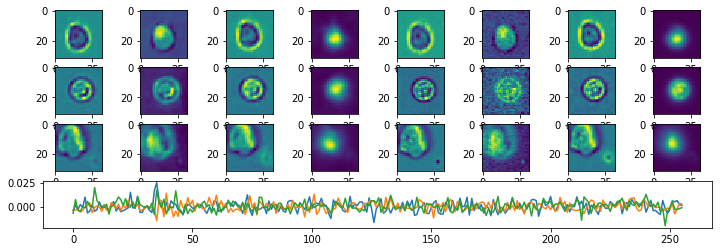

Epoch:  49 Iteration:  0 Loss:  1.2919799 1.191057 0.100922935


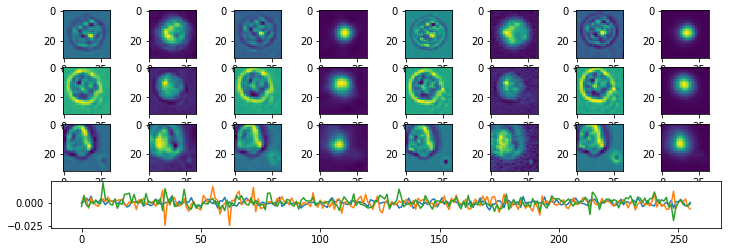

Epoch:  49 Iteration:  1000 Loss:  1.2709394 1.1779089 0.0930304


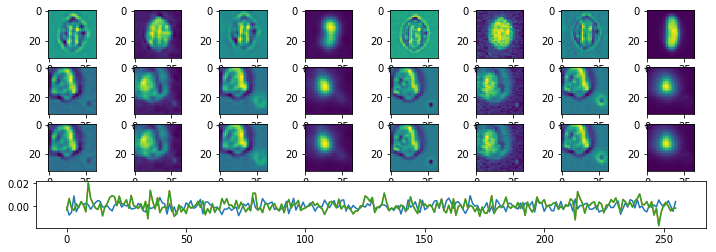

Epoch:  50 Iteration:  0 Loss:  1.2755319 1.1820307 0.09350122


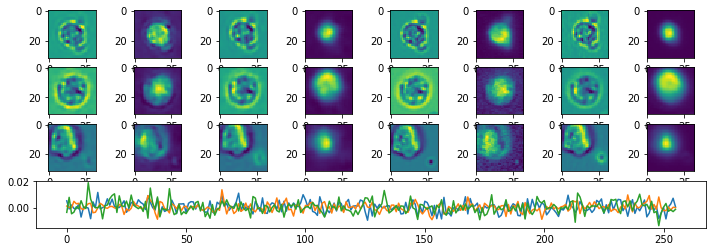

Epoch:  50 Iteration:  1000 Loss:  1.2462317 1.1514055 0.09482621


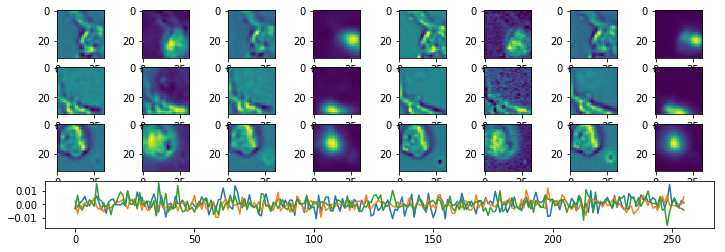

Epoch:  51 Iteration:  0 Loss:  1.7173704 1.5324949 0.18487552


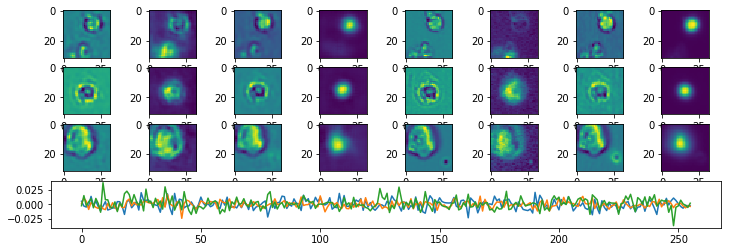

Epoch:  51 Iteration:  1000 Loss:  1.3859372 1.2521415 0.13379578


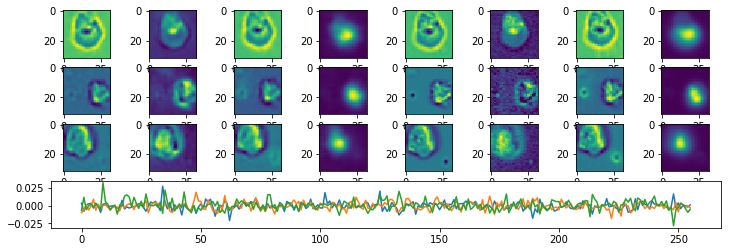

Epoch:  52 Iteration:  0 Loss:  1.366993 1.241746 0.12524697


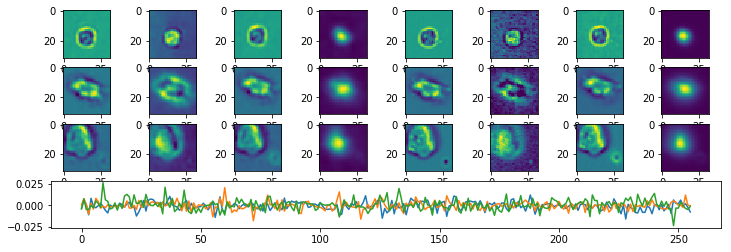

Epoch:  52 Iteration:  1000 Loss:  1.2945766 1.183652 0.11092458


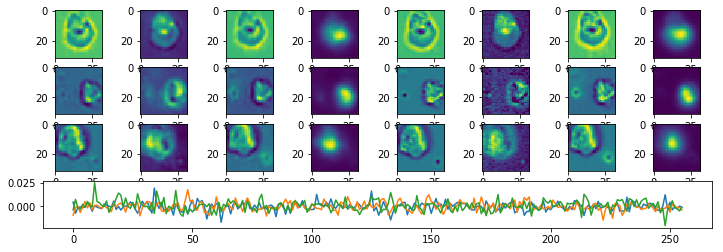

Epoch:  53 Iteration:  0 Loss:  1.2912996 1.1813445 0.109955035


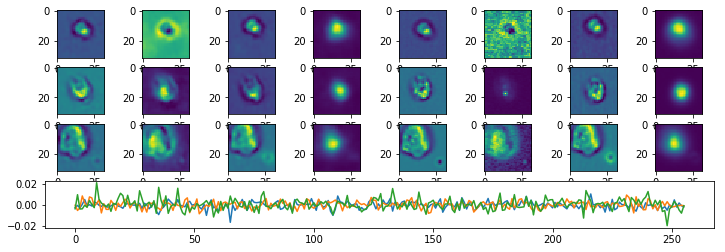

Epoch:  53 Iteration:  1000 Loss:  1.2622392 1.1622231 0.10001607


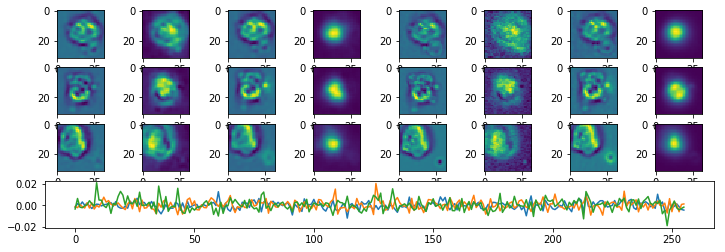

Epoch:  54 Iteration:  0 Loss:  1.2543236 1.1542344 0.10008917


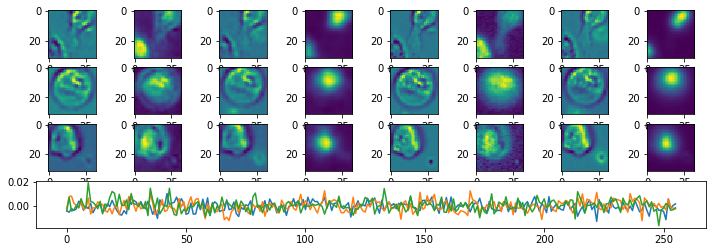

Epoch:  54 Iteration:  1000 Loss:  1.2500911 1.1594379 0.09065323


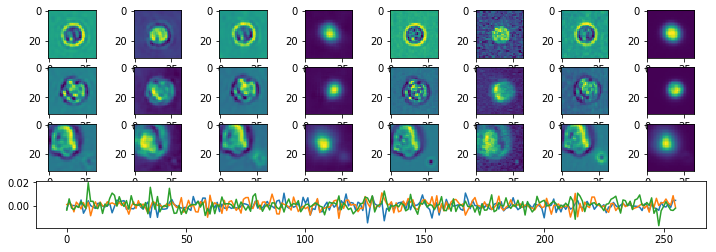

Epoch:  55 Iteration:  0 Loss:  1.2392886 1.1479332 0.09135538


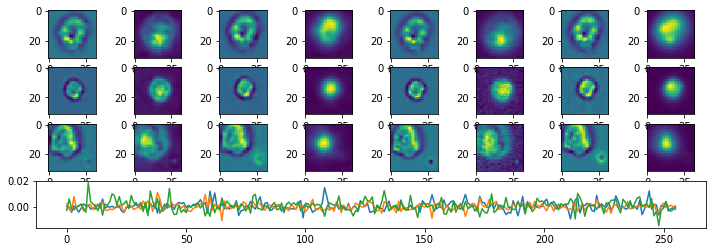

Epoch:  55 Iteration:  1000 Loss:  2.1111202 1.8851991 0.22592126


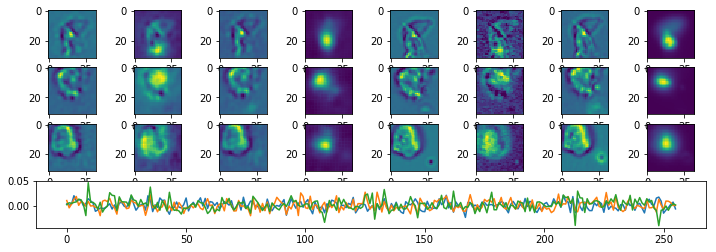

Epoch:  56 Iteration:  0 Loss:  1.4378802 1.3019221 0.13595805


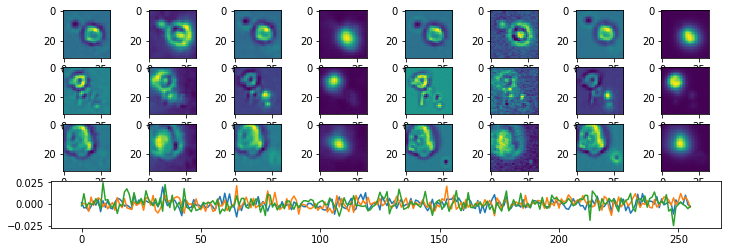

Epoch:  56 Iteration:  1000 Loss:  1.2846472 1.1728048 0.11184235


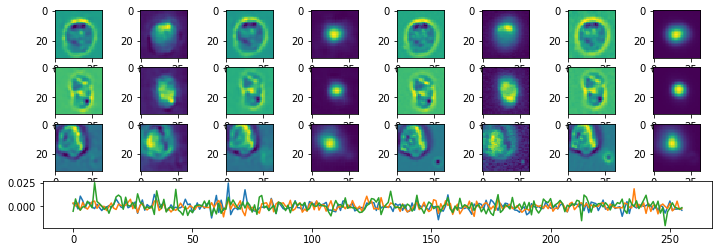

Epoch:  57 Iteration:  0 Loss:  1.2685615 1.1624337 0.10612778


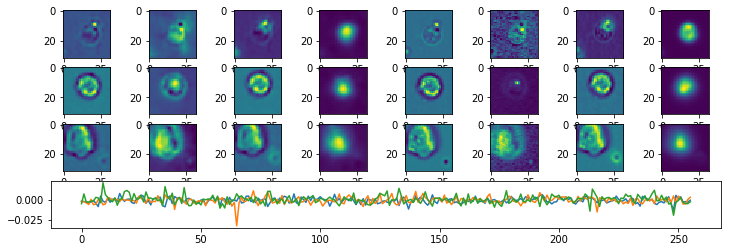

Epoch:  57 Iteration:  1000 Loss:  1.2411162 1.1418632 0.09925291


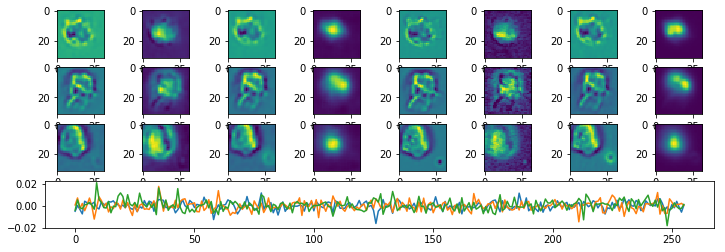

Epoch:  58 Iteration:  0 Loss:  1.2344502 1.1377336 0.096716665


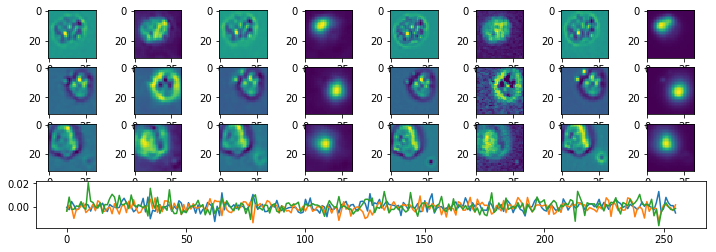

Epoch:  58 Iteration:  1000 Loss:  1.2402896 1.1518401 0.08844947


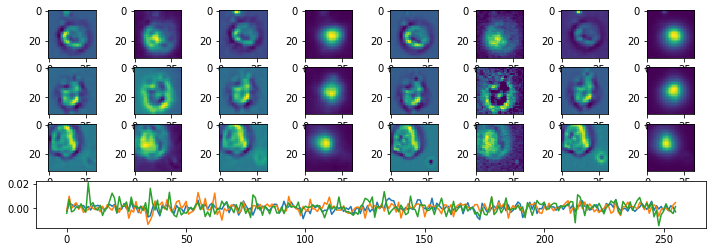

Epoch:  59 Iteration:  0 Loss:  1.2301817 1.1400236 0.09015808


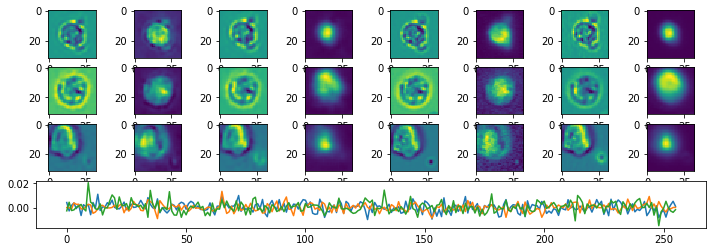

Epoch:  59 Iteration:  1000 Loss:  1.2037585 1.1168969 0.08686167


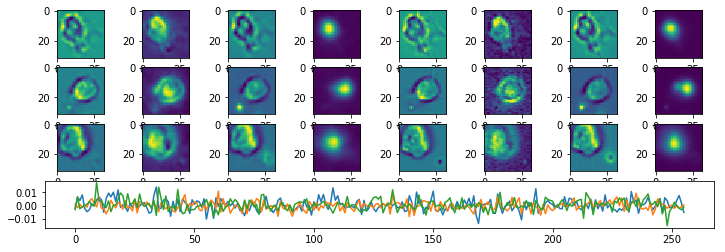

Done


In [6]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 60
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 256 #128 + 64
p_droprate = 0.85
p_stdev = .04
p_slam = .001
p_denoise = None
enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['slam'] = p_slam
params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes
params['denoise'] = p_denoise
cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-07-13-Snail/"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 1000, cpdir)

In [ ]:
x = 4
x